## Apriori

# Globally

In [ ]:
data <- read.csv("online_retail.csv", fileEncoding = "UTF-8-BOM", na.strings = c("NA","N/A",""))
data <- na.omit(data)
data

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<dbl>,<chr>
1,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom
2,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
3,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom
4,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
5,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
6,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01 08:26:00,7.65,17850,United Kingdom
7,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01 08:26:00,4.25,17850,United Kingdom
8,536366,22633,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850,United Kingdom
9,536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850,United Kingdom


Exploratory Data Analysis (EDA)

In [ ]:
any(is.na(data))

[1] FALSE

In [ ]:
str(data)

'data.frame':	406829 obs. of  8 variables:
 $ InvoiceNo  : chr  "536365" "536365" "536365" "536365" ...
 $ StockCode  : chr  "85123A" "71053" "84406B" "84029G" ...
 $ Description: chr  "WHITE HANGING HEART T-LIGHT HOLDER" "WHITE METAL LANTERN" "CREAM CUPID HEARTS COAT HANGER" "KNITTED UNION FLAG HOT WATER BOTTLE" ...
 $ Quantity   : int  6 6 8 6 6 2 6 6 6 32 ...
 $ InvoiceDate: chr  "2010-12-01 08:26:00" "2010-12-01 08:26:00" "2010-12-01 08:26:00" "2010-12-01 08:26:00" ...
 $ UnitPrice  : num  2.55 3.39 2.75 3.39 3.39 7.65 4.25 1.85 1.85 1.69 ...
 $ CustomerID : num  17850 17850 17850 17850 17850 ...
 $ Country    : chr  "United Kingdom" "United Kingdom" "United Kingdom" "United Kingdom" ...
 - attr(*, "na.action")= 'omit' Named int [1:135080] 623 1444 1445 1446 1447 1448 1449 1450 1451 1452 ...
  ..- attr(*, "names")= chr [1:135080] "623" "1444" "1445" "1446" ...


In [ ]:
sum(duplicated(data))
data <- data[!duplicated(data), ]

[1] 5225

In [ ]:
summary(data)

  InvoiceNo          StockCode         Description           Quantity        
 Length:401604      Length:401604      Length:401604      Min.   :-80995.00  
 Class :character   Class :character   Class :character   1st Qu.:     2.00  
 Mode  :character   Mode  :character   Mode  :character   Median :     5.00  
                                                          Mean   :    12.18  
                                                          3rd Qu.:    12.00  
                                                          Max.   : 80995.00  
 InvoiceDate          UnitPrice          CustomerID      Country         
 Length:401604      Min.   :    0.00   Min.   :12346   Length:401604     
 Class :character   1st Qu.:    1.25   1st Qu.:13939   Class :character  
 Mode  :character   Median :    1.95   Median :15145   Mode  :character  
                    Mean   :    3.47   Mean   :15281                     
                    3rd Qu.:    3.75   3rd Qu.:16784                     
          

In [ ]:
negative_quantities <- data[data$Quantity < 0, ]
head(negative_quantities)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<dbl>,<chr>
142,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527,United Kingdom
155,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311,United Kingdom
236,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548,United Kingdom
237,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548,United Kingdom
238,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548,United Kingdom
239,C536391,21980,PACK OF 12 RED RETROSPOT TISSUES,-24,2010-12-01 10:24:00,0.29,17548,United Kingdom


Data Visualization


WHITE HANGING HEART T-LIGHT HOLDER           REGENCY CAKESTAND 3 TIER 
                              2058                               1894 
           JUMBO BAG RED RETROSPOT                      PARTY BUNTING 
                              1659                               1409 
     ASSORTED COLOUR BIRD ORNAMENT 
                              1405 

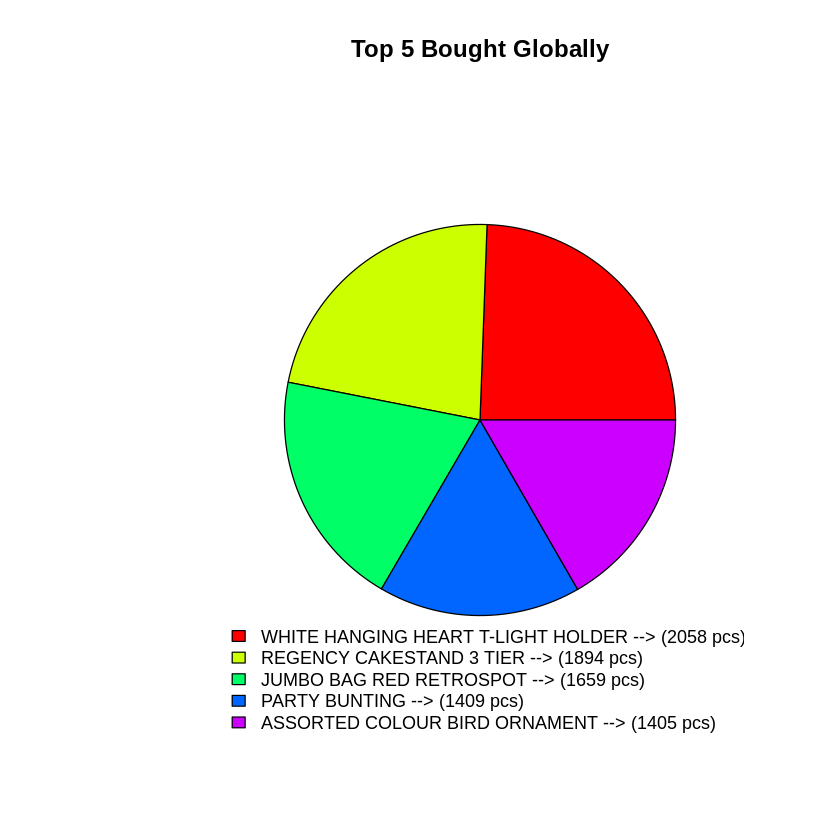

In [ ]:
itemCount <- table(data$Description)
# itemCount

sorted_itemCount <- sort(itemCount, decreasing = TRUE)
# sorted_itemCount

top5_item <- head(sorted_itemCount, 5)
top5_item

top5_Count <- table(top5_item)
labels <- paste(names(top5_item), " --> (", top5_item, " pcs)", sep = "")

par(mar = c(4, 9, 4, 4))  # Adjust top, bottom, left, right margins

# Create the pie chart with no labels
pie(top5_item,
    main = "Top 5 Bought Globally",
    labels = NA,  # Suppress labels on the pie
    col = rainbow(length(top5_item)),
    cex = 0.8,
)

# Add a legend to the side
legend("bottomleft",        # Position of the legend
       legend = labels,   # Use prepared labels
       fill = rainbow(length(top5_item)),  # Match pie chart colors
       cex = 0.9,          # Adjust legend text size
       inset = c(0, 0),
       bty = "n"
)


Now onto the Association Rules shenanigans

In [ ]:
install.packages("arules")
library(arules)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
transactionList <- split(data$Description, data$InvoiceNo)
transactionListFinal <- as(transactionList, "transactions")

Warning message in asMethod(object):
“removing duplicated items in transactions”


In [ ]:
freqItemsets <- apriori(transactionListFinal, parameter = list(supp = 0.01, target = "frequent itemsets"))
inspect(freqItemsets)

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
         NA    0.1    1 none FALSE            TRUE       5    0.01      1
 maxlen            target  ext
     10 frequent itemsets TRUE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 221 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[3896 item(s), 22190 transaction(s)] done [0.15s].
sorting and recoding items ... [517 item(s)] done [0.01s].
creating transaction tree ... done [0.01s].
checking subsets of size 1 2 3 4 done [0.02s].
sorting transactions ... done [0.00s].
writing ... [739 set(s)] done [0.00s].
creating S4 object  ... done [0.00s].
      items                                     support count
[1]   {RECYCLED ACAPULCO MAT TURQUOISE}      0.01000451   222
[2]   {15CM CHRISTMAS GLASS BALL 20 LIGHTS}  0.01063542   236
[3]   {PARISIENNE KEY CABINET }     

In [ ]:
rules <- ruleInduction(freqItemsets, conf = 0.1)
inspect(rules)

      lhs                                      rhs                                      support confidence      lift
[1]   {SET/6 RED SPOTTY PAPER PLATES}       => {SET/6 RED SPOTTY PAPER CUPS}         0.01063542  0.7261538 56.538084
[2]   {SET/6 RED SPOTTY PAPER CUPS}         => {SET/6 RED SPOTTY PAPER PLATES}       0.01063542  0.8280702 56.538084
[3]   {REGENCY TEA PLATE ROSES }            => {REGENCY TEA PLATE GREEN }            0.01045516  0.6823529 55.059679
[4]   {REGENCY TEA PLATE GREEN }            => {REGENCY TEA PLATE ROSES }            0.01045516  0.8436364 55.059679
[5]   {PINK HAPPY BIRTHDAY BUNTING}         => {BLUE HAPPY BIRTHDAY BUNTING}         0.01153673  0.7052342 43.712698
[6]   {BLUE HAPPY BIRTHDAY BUNTING}         => {PINK HAPPY BIRTHDAY BUNTING}         0.01153673  0.7150838 43.712698
[7]   {ALARM CLOCK BAKELIKE RED }           => {ALARM CLOCK BAKELIKE CHOCOLATE}      0.01036503  0.2535832 16.797051
[8]   {ALARM CLOCK BAKELIKE CHOCOLATE}      => {ALARM CLOCK BAKE

But what if we increase the supp?

In [ ]:
freqItemsets <- apriori(transactionListFinal, parameter = list(supp = 0.02, target = "frequent itemsets"))
rules <- ruleInduction(freqItemsets, conf = 0.1)
inspect(rules)

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
         NA    0.1    1 none FALSE            TRUE       5    0.02      1
 maxlen            target  ext
     10 frequent itemsets TRUE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 443 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[3896 item(s), 22190 transaction(s)] done [0.16s].
sorting and recoding items ... [161 item(s)] done [0.01s].
creating transaction tree ... done [0.01s].
checking subsets of size 1 2 3 done [0.00s].
sorting transactions ... done [0.01s].
writing ... [176 set(s)] done [0.00s].
creating S4 object  ... done [0.01s].
     lhs                                     rhs                                     support confidence      lift
[1]  {PINK REGENCY TEACUP AND SAUCER}     => {GREEN REGENCY TEACUP AND SAUCER}    0.02122578  0.7969543 24.126

In [ ]:
# freqItemsets <- apriori(transactionListFinal, parameter = list(supp = 0.03, target = "frequent itemsets"))
# rules <- ruleInduction(freqItemsets, conf = 0.1)
# inspect(rules)

In [ ]:
# freqItemsets <- apriori(transactionListFinal, parameter = list(supp = 0.04, target = "frequent itemsets"))
# rules <- ruleInduction(freqItemsets, conf = 0.1)
# inspect(rules)

That is the buying pattern globally. But what if we look at it by region?

In [ ]:
# Count the occurrences of each country
country_counts <- table(data$Country)

# Sort by the counts (descending order)
sorted_countries <- sort(country_counts, decreasing = TRUE)

# Print the sorted countries with counts
print(sorted_countries)


      United Kingdom              Germany               France 
              356728                 9480                 8475 
                EIRE                Spain          Netherlands 
                7475                 2528                 2371 
             Belgium          Switzerland             Portugal 
                2069                 1877                 1471 
           Australia               Norway                Italy 
                1258                 1086                  803 
     Channel Islands              Finland               Cyprus 
                 757                  695                  611 
              Sweden              Austria              Denmark 
                 461                  401                  389 
               Japan               Poland                  USA 
                 358                  341                  291 
              Israel          Unspecified            Singapore 
                 247                  2

# United Kingdom

In [ ]:
UKData <- subset(data, data$Country == "United Kingdom")
UKData

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<dbl>,<chr>
1,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom
2,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
3,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom
4,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
5,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
6,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01 08:26:00,7.65,17850,United Kingdom
7,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01 08:26:00,4.25,17850,United Kingdom
8,536366,22633,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850,United Kingdom
9,536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850,United Kingdom


Data Visualization


WHITE HANGING HEART T-LIGHT HOLDER           REGENCY CAKESTAND 3 TIER 
                              1969                               1564 
           JUMBO BAG RED RETROSPOT      ASSORTED COLOUR BIRD ORNAMENT 
                              1502                               1330 
                     PARTY BUNTING 
                              1320 

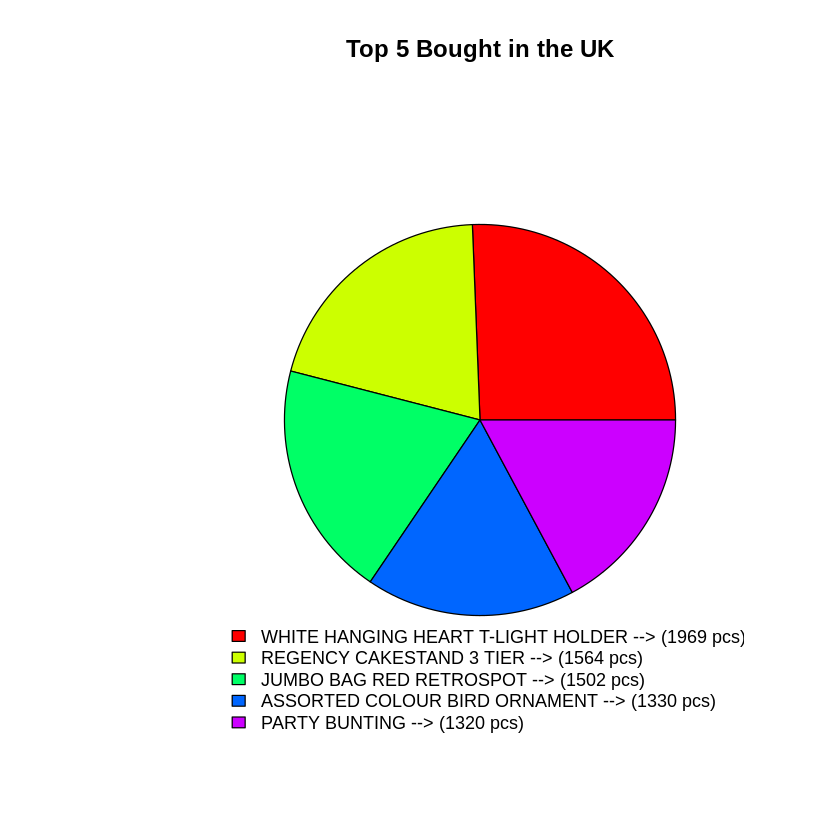

In [ ]:
itemCountUK <- table(UKData$Description)
# itemCount

sorted_itemCountUK <- sort(itemCountUK, decreasing = TRUE)
# sorted_itemCount

top5_itemUK <- head(sorted_itemCountUK, 5)
top5_itemUK

top5_CountUK <- table(top5_itemUK)
# label <- c("White H. Heart Holder", "Regency Cakestand 3 Tier", "Jumbo Bag Red Retrosport", "Party Bunting", "Assorted Colour Bird Ornament")
labelsUK <- paste(names(top5_itemUK), " --> (", top5_itemUK, " pcs)", sep = "")

par(mar = c(4, 9, 4, 4))  # Adjust top, bottom, left, right margins

# Create the pie chart with no labels
pie(top5_itemUK,
    main = "Top 5 Bought in the UK",
    labels = NA,  # Suppress labels on the pie
    col = rainbow(length(top5_itemUK)),
    cex = 0.8,
)

# Add a legend to the side
legend("bottomleft",        # Position of the legend
       legend = labelsUK,   # Use prepared labels
       fill = rainbow(length(top5_itemUK)),  # Match pie chart colors
       cex = 0.9,          # Adjust legend text size
       inset = c(0, 0),
       bty = "n"
)

Apriori

In [ ]:
transactionListUK <- split(UKData$Description, UKData$InvoiceNo) # <-- split(what to group, group by what)
transactionListFinalUK <- as(transactionListUK, "transactions")

Warning message in asMethod(object):
“removing duplicated items in transactions”


In [ ]:
freqItemsetsUK <- apriori(transactionListFinalUK, parameter = list(supp = 0.01, target = "frequent itemsets"))
inspect(freqItemsetsUK)

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
         NA    0.1    1 none FALSE            TRUE       5    0.01      1
 maxlen            target  ext
     10 frequent itemsets TRUE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 198 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[3860 item(s), 19857 transaction(s)] done [0.14s].
sorting and recoding items ... [506 item(s)] done [0.01s].
creating transaction tree ... done [0.01s].
checking subsets of size 1 2 3 4 done [0.02s].
sorting transactions ... done [0.00s].
writing ... [723 set(s)] done [0.00s].
creating S4 object  ... done [0.00s].
      items                                     support count
[1]   {PARISIENNE KEY CABINET }              0.01092814   217
[2]   {15CM CHRISTMAS GLASS BALL 20 LIGHTS}  0.01087778   216
[3]   {BREAD BIN DINER STYLE RED }  

In [ ]:
rulesUK <- ruleInduction(freqItemsetsUK, conf = 0.1)
inspect(rulesUK)

      lhs                                      rhs                                      support confidence      lift
[1]   {PINK HAPPY BIRTHDAY BUNTING}         => {BLUE HAPPY BIRTHDAY BUNTING}         0.01097850  0.6898734 44.914152
[2]   {BLUE HAPPY BIRTHDAY BUNTING}         => {PINK HAPPY BIRTHDAY BUNTING}         0.01097850  0.7147541 44.914152
[3]   {ALARM CLOCK BAKELIKE RED }           => {ALARM CLOCK BAKELIKE ORANGE}         0.01097850  0.2770013 16.667922
[4]   {ALARM CLOCK BAKELIKE ORANGE}         => {ALARM CLOCK BAKELIKE RED }           0.01097850  0.6606061 16.667922
[5]   {SET OF 12 MINI LOAF BAKING CASES}    => {SET OF 12 FAIRY CAKE BAKING CASES}   0.01017274  0.6666667 33.943590
[6]   {SET OF 12 FAIRY CAKE BAKING CASES}   => {SET OF 12 MINI LOAF BAKING CASES}    0.01017274  0.5179487 33.943590
[7]   {PAINTED METAL PEARS ASSORTED}        => {ASSORTED COLOUR BIRD ORNAMENT}       0.01228786  0.7240356 10.974943
[8]   {ASSORTED COLOUR BIRD ORNAMENT}       => {PAINTED METAL PE

In [ ]:
# Let's try raising the supp
freqItemsetsUK <- apriori(transactionListFinalUK, parameter = list(supp = 0.02, target = "frequent itemsets"))
rulesUK <- ruleInduction(freqItemsetsUK, conf = 0.1)
inspect(rulesUK)

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
         NA    0.1    1 none FALSE            TRUE       5    0.02      1
 maxlen            target  ext
     10 frequent itemsets TRUE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 397 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[3860 item(s), 19857 transaction(s)] done [0.15s].
sorting and recoding items ... [149 item(s)] done [0.01s].
creating transaction tree ... done [0.01s].
checking subsets of size 1 2 3 done [0.00s].
sorting transactions ... done [0.01s].
writing ... [168 set(s)] done [0.00s].
creating S4 object  ... done [0.00s].
     lhs                                     rhs                                     support confidence      lift
[1]  {PINK REGENCY TEACUP AND SAUCER}     => {GREEN REGENCY TEACUP AND SAUCER}    0.02074835  0.7862595 24.093

In [ ]:
#  freqItemsetsUK <- apriori(transactionListFinalUK, parameter = list(supp = 0.03, target = "frequent itemsets"))
#  rulesUK <- ruleInduction(freqItemsetsUK, conf = 0.1)
#  inspect(rulesUK)

# France

In [ ]:
dataFRANCE <- subset(data, data$Country == "France")
dataFRANCE

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<dbl>,<chr>
27,536370,22728,ALARM CLOCK BAKELIKE PINK,24,2010-12-01 08:45:00,3.75,12583,France
28,536370,22727,ALARM CLOCK BAKELIKE RED,24,2010-12-01 08:45:00,3.75,12583,France
29,536370,22726,ALARM CLOCK BAKELIKE GREEN,12,2010-12-01 08:45:00,3.75,12583,France
30,536370,21724,PANDA AND BUNNIES STICKER SHEET,12,2010-12-01 08:45:00,0.85,12583,France
31,536370,21883,STARS GIFT TAPE,24,2010-12-01 08:45:00,0.65,12583,France
32,536370,10002,INFLATABLE POLITICAL GLOBE,48,2010-12-01 08:45:00,0.85,12583,France
33,536370,21791,VINTAGE HEADS AND TAILS CARD GAME,24,2010-12-01 08:45:00,1.25,12583,France
34,536370,21035,SET/2 RED RETROSPOT TEA TOWELS,18,2010-12-01 08:45:00,2.95,12583,France
35,536370,22326,ROUND SNACK BOXES SET OF4 WOODLAND,24,2010-12-01 08:45:00,2.95,12583,France


Data Visualization


                         POSTAGE               RABBIT NIGHT LIGHT 
                             311                               74 
   RED TOADSTOOL LED NIGHT LIGHT   PLASTERS IN TIN CIRCUS PARADE  
                              71                               68 
PLASTERS IN TIN WOODLAND ANIMALS 
                              67 

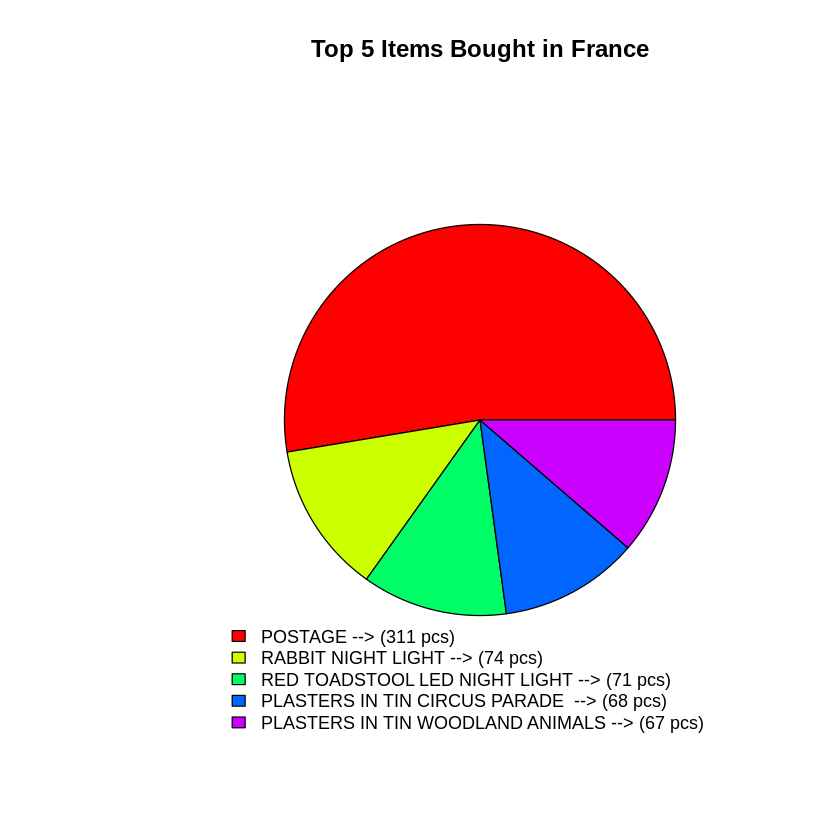

In [ ]:
itemCountFRANCE <- table(dataFRANCE$Description)
# itemCount

sorted_itemCountFRANCE <- sort(itemCountFRANCE, decreasing = TRUE)
# sorted_itemCount

top5_itemFRANCE <- head(sorted_itemCountFRANCE, 5)
top5_itemFRANCE

top5_CountFRANCE <- table(top5_itemFRANCE)
# label <- c("White H. Heart Holder", "Regency Cakestand 3 Tier", "Jumbo Bag Red Retrosport", "Party Bunting", "Assorted Colour Bird Ornament")
labelsFRANCE <- paste(names(top5_itemFRANCE), " --> (", top5_itemFRANCE, " pcs)", sep = "")

par(mar = c(4, 9, 4, 4))  # Adjust top, bottom, left, right margins

# Create the pie chart with no labels
pie(top5_itemFRANCE,
    main = "Top 5 Items Bought in France",
    labels = NA,  # Suppress labels on the pie
    col = rainbow(length(top5_itemFRANCE)),
    cex = 0.8,
)

# Add a legend to the side
legend("bottomleft",        # Position of the legend
       legend = labelsFRANCE,   # Use prepared labels
       fill = rainbow(length(top5_itemFRANCE)),  # Match pie chart colors
       cex = 0.9,          # Adjust legend text size
       inset = c(0, 0),
       bty = "n"
)


In [ ]:
transactionListFRANCE <- split(dataFRANCE$Description, dataFRANCE$InvoiceNo) # <-- split(what to group, group by what)
transactionListFinalFRANCE <- as(transactionListFRANCE, "transactions")

Warning message in asMethod(object):
“removing duplicated items in transactions”


In [ ]:
freqItemsetsFRANCE <- apriori(transactionListFinalFRANCE, parameter = list(supp = 0.01, target = "frequent itemsets"))
inspect(freqItemsetsFRANCE)

Streaming output truncated to the last 5000 lines.
         SET/6 RED SPOTTY PAPER CUPS,                          
         SET/6 RED SPOTTY PAPER PLATES}        0.01091703     5
[11594] {ALARM CLOCK BAKELIKE GREEN,                           
         ALARM CLOCK BAKELIKE PINK,                            
         POSTAGE,                                              
         SET/6 RED SPOTTY PAPER CUPS,                          
         SET/6 RED SPOTTY PAPER PLATES}        0.01091703     5
[11595] {ALARM CLOCK BAKELIKE GREEN,                           
         ALARM CLOCK BAKELIKE PINK,                            
         PLASTERS IN TIN SPACEBOY,                             
         ROUND SNACK BOXES SET OF4 WOODLAND ,                  
         SET/6 RED SPOTTY PAPER PLATES}        0.01091703     5
[11596] {ALARM CLOCK BAKELIKE GREEN,                           
         ALARM CLOCK BAKELIKE PINK,                            
         PLASTERS IN TIN CIRCUS PARADE ,             

In [ ]:
rulesFRANCE <- ruleInduction(freqItemsetsFRANCE, conf = 0.1)
inspect(rulesFRANCE)

        lhs                                       rhs                                      support confidence       lift
[1]     {SET 3 PAPER VINTAGE CHICK PAPER EGG}  => {POSTAGE}                             0.01310044  0.8571429  1.2622876
[2]     {SET OF 3 BUTTERFLY COOKIE CUTTERS}    => {POSTAGE}                             0.01091703  0.8333333  1.2272240
[3]     {EDWARDIAN PARASOL PINK}               => {POSTAGE}                             0.01091703  1.0000000  1.4726688
[4]     {SET 36 COLOUR PENCILS SPACEBOY }      => {SET 36 COLOUR PENCILS DOLLY GIRL}    0.01091703  0.8333333 63.6111111
[5]     {SET 36 COLOUR PENCILS DOLLY GIRL}     => {SET 36 COLOUR PENCILS SPACEBOY }     0.01091703  0.8333333 63.6111111
[6]     {SET OF 4 PANTRY JELLY MOULDS}         => {POSTAGE}                             0.01091703  1.0000000  1.4726688
[7]     {PAPER CHAIN KIT 50'S CHRISTMAS }      => {POSTAGE}                             0.01091703  0.8333333  1.2272240
[8]     {PARISIENNE CURIO CABINE

In [ ]:
# Raising the supp
freqItemsetsFRANCE <- apriori(transactionListFinalFRANCE, parameter = list(supp = 0.02, target = "frequent itemsets"))
rulesFRANCE <- ruleInduction(freqItemsetsFRANCE, conf = 0.1)
# inspect(rulesFRANCE)
inspect(head(rulesFRANCE, 10))

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
         NA    0.1    1 none FALSE            TRUE       5    0.02      1
 maxlen            target  ext
     10 frequent itemsets TRUE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 9 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[1545 item(s), 458 transaction(s)] done [0.00s].
sorting and recoding items ... [216 item(s)] done [0.00s].
creating transaction tree ... done [0.00s].
checking subsets of size 1 2 3 4 5 6 7 done [0.00s].
sorting transactions ... done [0.00s].
writing ... [1316 set(s)] done [0.00s].
creating S4 object  ... done [0.00s].
     lhs                                     rhs       support    confidence
[1]  {CAKE STAND WHITE TWO TIER LACE}     => {POSTAGE} 0.02401747 0.9166667 
[2]  {MINI JIGSAW CIRCUS PARADE }         => {POSTAGE} 0.02183406

In [ ]:
freqItemsetsFRANCE <- apriori(transactionListFinalFRANCE, parameter = list(supp = 0.03, target = "frequent itemsets"))
rulesFRANCE <- ruleInduction(freqItemsetsFRANCE, conf = 0.1)
# inspect(rulesFRANCE)
inspect(head(rulesFRANCE, 10))

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
         NA    0.1    1 none FALSE            TRUE       5    0.03      1
 maxlen            target  ext
     10 frequent itemsets TRUE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 13 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[1545 item(s), 458 transaction(s)] done [0.00s].
sorting and recoding items ... [134 item(s)] done [0.00s].
creating transaction tree ... done [0.00s].
checking subsets of size 1 2 3 4 5 done [0.00s].
sorting transactions ... done [0.00s].
writing ... [487 set(s)] done [0.00s].
creating S4 object  ... done [0.00s].
     lhs                                    rhs                                    support confidence       lift
[1]  {RED RETROSPOT CAKE STAND}          => {POSTAGE}                           0.03056769  0.6363636  0.93715

In [ ]:
freqItemsetsFRANCE <- apriori(transactionListFinalFRANCE, parameter = list(supp = 0.04, target = "frequent itemsets"))
rulesFRANCE <- ruleInduction(freqItemsetsFRANCE, conf = 0.1)
# inspect(rulesFRANCE)
inspect(head(rulesFRANCE, 10))

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
         NA    0.1    1 none FALSE            TRUE       5    0.04      1
 maxlen            target  ext
     10 frequent itemsets TRUE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 18 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[1545 item(s), 458 transaction(s)] done [0.00s].
sorting and recoding items ... [87 item(s)] done [0.00s].
creating transaction tree ... done [0.00s].
checking subsets of size 1 2 3 4 done [0.00s].
sorting transactions ... done [0.00s].
writing ... [219 set(s)] done [0.00s].
creating S4 object  ... done [0.00s].
     lhs                                    rhs                               support confidence      lift
[1]  {RED RETROSPOT CUP}                 => {POSTAGE}                      0.04148472  1.0000000  1.472669
[2]  {RETROS

# Germany

In [ ]:
dataGERMANY <- subset(data, data$Country == "Germany")
dataGERMANY

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<dbl>,<chr>
1110,536527,22809,SET OF 6 T-LIGHTS SANTA,6,2010-12-01 13:04:00,2.95,12662,Germany
1111,536527,84347,ROTATING SILVER ANGELS T-LIGHT HLDR,6,2010-12-01 13:04:00,2.55,12662,Germany
1112,536527,84945,MULTI COLOUR SILVER T-LIGHT HOLDER,12,2010-12-01 13:04:00,0.85,12662,Germany
1113,536527,22242,5 HOOK HANGER MAGIC TOADSTOOL,12,2010-12-01 13:04:00,1.65,12662,Germany
1114,536527,22244,3 HOOK HANGER MAGIC GARDEN,12,2010-12-01 13:04:00,1.95,12662,Germany
1115,536527,22243,5 HOOK HANGER RED MAGIC TOADSTOOL,12,2010-12-01 13:04:00,1.65,12662,Germany
1116,536527,47421,ASSORTED COLOUR LIZARD SUCTION HOOK,24,2010-12-01 13:04:00,0.42,12662,Germany
1117,536527,20712,JUMBO BAG WOODLAND ANIMALS,10,2010-12-01 13:04:00,1.95,12662,Germany
1118,536527,20713,JUMBO BAG OWLS,10,2010-12-01 13:04:00,1.95,12662,Germany


Data Visualization


                            POSTAGE ROUND SNACK BOXES SET OF4 WOODLAND  
                                383                                 119 
           REGENCY CAKESTAND 3 TIER  ROUND SNACK BOXES SET OF 4 FRUITS  
                                 81                                  78 
   PLASTERS IN TIN WOODLAND ANIMALS 
                                 66 

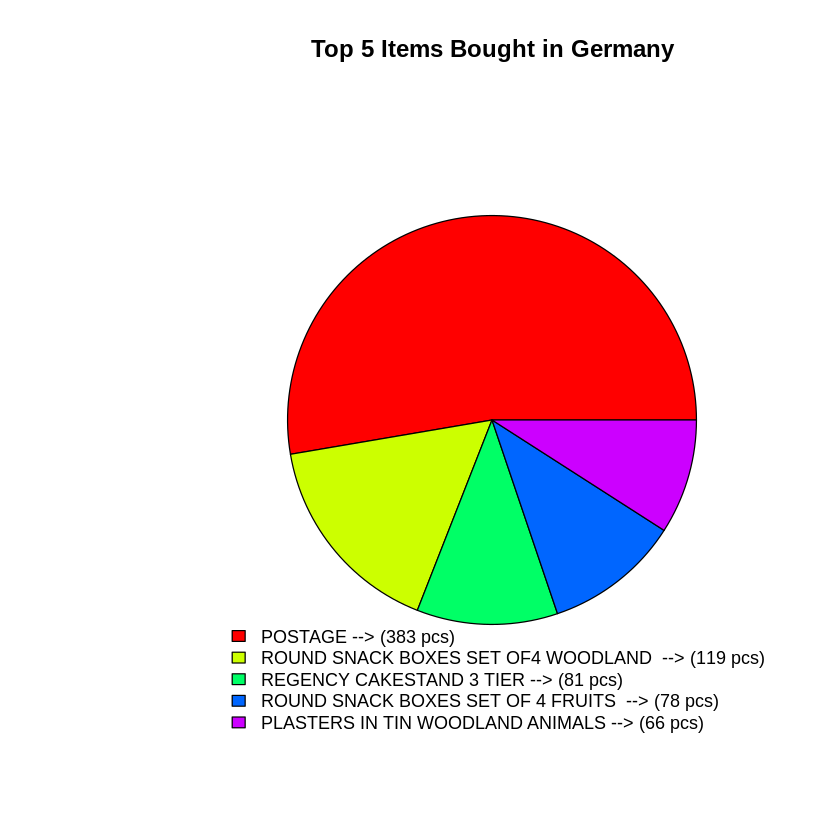

In [ ]:
itemCountGERMANY <- table(dataGERMANY$Description)
# itemCount

sorted_itemCountGERMANY <- sort(itemCountGERMANY, decreasing = TRUE)
# sorted_itemCount

top5_itemGERMANY <- head(sorted_itemCountGERMANY, 5)
top5_itemGERMANY

top5_CountGERMANY <- table(top5_itemGERMANY)
# label <- c("White H. Heart Holder", "Regency Cakestand 3 Tier", "Jumbo Bag Red Retrosport", "Party Bunting", "Assorted Colour Bird Ornament")
labelsGERMANY <- paste(names(top5_itemGERMANY), " --> (", top5_itemGERMANY, " pcs)", sep = "")

par(mar = c(4, 9, 4, 3))  # Adjust top, bottom, left, right margins

# Create the pie chart with no labels
pie(top5_itemGERMANY,
    main = "Top 5 Items Bought in Germany",
    labels = NA,  # Suppress labels on the pie
    col = rainbow(length(top5_itemGERMANY)),
    cex = 0.8,
)

# Add a legend to the side
legend("bottomleft",        # Position of the legend
       legend = labelsGERMANY,   # Use prepared labels
       fill = rainbow(length(top5_itemGERMANY)),  # Match pie chart colors
       cex = 0.9,          # Adjust legend text size
       inset = c(0, 0),
       bty = "n"
)


In [ ]:
transactionListGERMANY <- split(dataGERMANY$Description, dataGERMANY$InvoiceNo) # <-- split(what to group, group by what)
transactionListFinalGERMANY <- as(transactionListGERMANY, "transactions")

Warning message in asMethod(object):
“removing duplicated items in transactions”


In [ ]:
freqItemsetsGERMANY <- apriori(transactionListFinalGERMANY, parameter = list(supp = 0.01, target = "frequent itemsets"))
inspect(freqItemsetsGERMANY)

Streaming output truncated to the last 5000 lines.
[606]  {POSTAGE,                                              
        RED RETROSPOT WRAP }                  0.01492537     9
[607]  {POSTAGE,                                              
        SET/6 FRUIT SALAD PAPER CUPS}         0.01824212    11
[608]  {PACK OF 60 MUSHROOM CAKE CASES,                       
        PACK OF 60 PINK PAISLEY CAKE CASES}   0.01160862     7
[609]  {PACK OF 60 PINK PAISLEY CAKE CASES,                   
        POSTAGE}                              0.01160862     7
[610]  {ASSORTED COLOUR BIRD ORNAMENT,                        
        POSTAGE}                              0.01824212    11
[611]  {POSTAGE,                                              
        SET OF SALT AND PEPPER TOADSTOOLS}    0.01824212    11
[612]  {CHARLOTTE BAG DOLLY GIRL DESIGN,                      
        WOODLAND CHARLOTTE BAG}               0.01160862     7
[613]  {POSTAGE,                                              
    

In [ ]:
rulesGERMANY <- ruleInduction(freqItemsetsGERMANY, conf = 0.1)
inspect(rulesGERMANY)

       lhs                                       rhs                                      support confidence       lift
[1]    {3 HOOK PHOTO SHELF ANTIQUE WHITE}     => {POSTAGE}                             0.01160862  0.8750000  1.3776110
[2]    {PANTRY CHOPPING BOARD}                => {POSTAGE}                             0.01160862  1.0000000  1.5744125
[3]    {CERAMIC CAKE DESIGN SPOTTED PLATE}    => {POSTAGE}                             0.01492537  1.0000000  1.5744125
[4]    {VICTORIAN GLASS HANGING T-LIGHT}      => {POSTAGE}                             0.01160862  1.0000000  1.5744125
[5]    {STAR WREATH DECORATION WITH BELL}     => {HEART WREATH DECORATION WITH BELL}   0.01160862  1.0000000 67.0000000
[6]    {HEART WREATH DECORATION WITH BELL}    => {STAR WREATH DECORATION WITH BELL}    0.01160862  0.7777778 67.0000000
[7]    {BIRDS MOBILE VINTAGE DESIGN}          => {POSTAGE}                             0.01160862  1.0000000  1.5744125
[8]    {ENAMEL FLOWER JUG CREAM}        

In [ ]:
# As usual, try increasing the supp
freqItemsetsGERMANY <- apriori(transactionListFinalGERMANY, parameter = list(supp = 0.02, target = "frequent itemsets"))
rulesGERMANY <- ruleInduction(freqItemsetsGERMANY, conf = 0.1)
inspect(rulesGERMANY)

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
         NA    0.1    1 none FALSE            TRUE       5    0.02      1
 maxlen            target  ext
     10 frequent itemsets TRUE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 12 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[1703 item(s), 603 transaction(s)] done [0.00s].
sorting and recoding items ... [185 item(s)] done [0.00s].
creating transaction tree ... done [0.00s].
checking subsets of size 1 2 3 4 done [0.00s].
sorting transactions ... done [0.00s].
writing ... [497 set(s)] done [0.00s].
creating S4 object  ... done [0.00s].
      lhs                                       rhs                                      support confidence       lift
[1]   {JUMBO BAG PEARS}                      => {POSTAGE}                             0.02155887  0.928571

In [ ]:
freqItemsetsGERMANY <- apriori(transactionListFinalGERMANY, parameter = list(supp = 0.03, target = "frequent itemsets"))
rulesGERMANY <- ruleInduction(freqItemsetsGERMANY, conf = 0.1)
inspect(rulesGERMANY)

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
         NA    0.1    1 none FALSE            TRUE       5    0.03      1
 maxlen            target  ext
     10 frequent itemsets TRUE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 18 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[1703 item(s), 603 transaction(s)] done [0.00s].
sorting and recoding items ... [86 item(s)] done [0.00s].
creating transaction tree ... done [0.00s].
checking subsets of size 1 2 3 4 done [0.00s].
sorting transactions ... done [0.00s].
writing ... [182 set(s)] done [0.00s].
creating S4 object  ... done [0.00s].
      lhs                                       rhs                                      support confidence       lift
[1]   {IVORY KITCHEN SCALES}                 => {POSTAGE}                             0.03150912  0.7307692

In [ ]:
freqItemsetsGERMANY <- apriori(transactionListFinalGERMANY, parameter = list(supp = 0.04, target = "frequent itemsets"))
rulesGERMANY <- ruleInduction(freqItemsetsGERMANY, conf = 0.1)
inspect(rulesGERMANY)

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
         NA    0.1    1 none FALSE            TRUE       5    0.04      1
 maxlen            target  ext
     10 frequent itemsets TRUE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 24 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[1703 item(s), 603 transaction(s)] done [0.00s].
sorting and recoding items ... [48 item(s)] done [0.00s].
creating transaction tree ... done [0.00s].
checking subsets of size 1 2 3 done [0.00s].
sorting transactions ... done [0.00s].
writing ... [92 set(s)] done [0.00s].
creating S4 object  ... done [0.00s].
     lhs                                       rhs                                      support confidence      lift
[1]  {RETROSPOT TEA SET CERAMIC 11 PC }     => {POSTAGE}                             0.04145937  0.9259259 1.457